**Atenção: Devido a natureza dos dados, para correto funcionamento, este notebook precisa ser executado em ambiente com memória RAM maior ou igual a 25 Gb.**

#**Ciência e Visualização de Dados**
##**Projeto Final - Entrega 02**
###Alunos: 
###Gleyson Roberto do Nascimento. RA: 043801. Elétrica.
###Negli René Gallardo Alvarado. RA: 234066. Saúde.
###Rafael Vinícius da Silveira. RA: 137382. Física.
###Sérgio Sevileanu. RA: 941095. Elétrica.



##Neste notebook do Google Colaboratory será realzada a análise estatística do Estado do Pará durante os anos de 2008 a 2018 segundo o banco de dados [SIHSUS](https://bigdata-metadados.icict.fiocruz.br/dataset/sistema-de-informacoes-hospitalares-do-sus-sihsus/resource/ae85ac54-6734-43b8-a820-6129a854e1ff).

##Desta forma, algumas definições iniciais e um disclaimer se fazem necessários para este projeto:

##Será definido como **diagnóstico correto** aquele em que houve apenas um diagnóstico de CID10, sem alterações durante o período até a alta;  
##Será definido como **diagnóstico equivocado** aquele em que houve mais de um diagnóstico de CID10, contudo, eles fazem parte do mesmo grupo, de forma que é plausível o equívoco dada a semelhança de sintomas entre os CID10;
##Será definido como **falha de diagnóstico** aquele em que houve mais de um diagnóstico de CID10, contudo, eles fazem parte de grupos distintos, de forma que embora possam existir sintomas semelhantes entre os CID10, caberia ao profissional uma análise mais aprofundada antes do diagnóstico.
##**Disclaimer**: Considerando a natureza do banco de dados do SIHSUS, isto é, um Big Data em que inúmeros funcionários do Sistema Único de Saúde possuem acesso e inserem os dados de forma manual em realdades e condições bastante distintas, existe a séria possibildade de erro sistemático, desta forma, a acurácia deste trabalho deve ser considerada com ressalvas.

##Instalando e Importando as Bibliotecas Necessárias.

In [ ]:
!pip install dask[complete]
!pip install -U -q PyDrive

In [ ]:
%load_ext google.colab.data_table
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle
import dask
from dask import dataframe as dd
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from google.colab import files
from oauth2client.client import GoogleCredentials
pd.set_option('display.max_columns', None)
pd.options.display.precision = 2
pd.options.display.max_rows = 50
import seaborn as sns
import missingno as msno
import matplotlib as mpl
from matplotlib import rcParams
mpl.rc('figure', max_open_warning = 0)
import statsmodels.api as sm
from statsmodels.api import graphics
import statsmodels.formula.api as smf
import statsmodels.stats.multicomp as multi
from scipy.stats import pearsonr
from scipy.stats import spearmanr
pd.set_option('display.max_columns', None)
import itertools
import sklearn
from sklearn.metrics import mean_squared_error
from sklearn.metrics import classification_report
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")

##Fazendo Autenticação do Gooogle Drive, Baixando os Arquivos e Criando Dataframes.

##O dicionário de Variáveis para os arquivos se econtra no [GitHub](https://github.com/grnbatera/Data4health/blob/main/assets/Dicion%C3%A1rio%20de%20Vari%C3%A1veis.csv) 



In [ ]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [ ]:
ids = ['1Hdzz218LvSzz_reDjndKZ2a6r_M_zKl-','1LcqDxhUAIwVEsMEcrfAAQGjoQvCD8qGn','19zx0YYD10ddYYGGk5BOwKcvLSlyE0DcQ','1vffaXC_qag8_dwf49xDPL7CctAxZ6_x-','16g9O_wwsowh5V6CHNRWxnpA1rQtxZX7G']
estados = ['SP','BA','PR','PA','GO']
arquivo = ['sp.pkl','ba.pkl','pr.pkl','pa.pkl','go.pkl']

In [ ]:
dflist=[]
for i in range (len(ids)):
  fileDownloaded = drive.CreateFile({'id':ids[i]})
  fileDownloaded.GetContentFile(arquivo[i])
  globals()[estados[i]] = pd.read_pickle(arquivo[i])
  globals()[estados[i]] = (globals()[estados[i]]).reset_index(drop=True)
  dflist.append(eval(estados[i]))

###Baixando arquivo com Valores Anuais de Custo por Internação e Atendimento e fazendo o merge com o arquivo principal do SIHSUS.

In [ ]:
fileDownloaded = drive.CreateFile({'id':'1corB_xGrJ3NDFpIXuKDl6Dri_tlPLzI0'})
fileDownloaded.GetContentFile('anual.xlsx')
anual = pd.read_excel('anual.xlsx',sheet_name='anual')

In [ ]:
anual['cep'] = [i[0] for i in anual.v241.str.split(' ').values]

In [ ]:
anual['cep']=anual['cep'].astype('int64')
anual.columns = ['v1',	'v241',	'v242',	'v243',	'v244',	'v245',	'v246',	'v247',	'v248',	'v249',	'v250',	'v251',	'v252','v0']

In [ ]:
full = pd.merge(PA,anual, on=['v0','v1'],how='left')

In [ ]:
full

,v0,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v19,v20,v21,v22,v23,v27,v28,v29,v30,v31,v32,v33,v43,v44,v45,v46,v47,v48,v49,v50,v51,v52,v54,v55,v56,v57,v59,v60,v61,v62,v63,v64,v65,v66,v67,v68,v69,v70,v72,v73,v76,v77,v78,v79,v80,v82,v83,v85,v87,v88,v89,v90,v91,v92,v93,v94,v96,v97,v98,v100,v101,v104,v105,v106,v107,v108,v109,v112,v113,v114,v115,v116,v117,v118,v121,v122,v123,v124,v125,v126,v127,v128,v137,v138,v139,v141,v143,v145,v147,v149,v151,v153,v155,v156,v157,v158,v159,v160,v161,v162,v163,v164,v165,v166,v167,v168,v169,v170,v171,v172,v173,v174,v175,v176,v177,v178,v179,v180,v181,v182,v183,v184,v185,v186,v187,v188,v189,v192,v193,v194,v195,v196,v197,v198,v199,v200,v201,v202,v203,v204,v205,v206,v207,v208,v209,v210,v211,v212,v213,v215,v216,v218,v219,v220,v221,v222,v223,v224,v225,v226,v227,v228,v229,v230,v231,v232,v234,v235,v237,v238,v239,v241,v242,v243,v244,v245,v246,v247,v248,v249,v250,v251,v252
0,150000,2008,12,3,NaN,1508109442279,AIH normal,1508109442279,1,Normal,68371970,150060,15,19200114,3,Feminino,0,0,0,0,Não utilizou UTI,0,0,6,303040149,303040149,525.83,64.38,590.21,0.00,255.50,20081202,20081208,I630,NaN,12,Alta melhorado,40,NaN,NaN,2,Estadual plena,0,Não,150060,15,4,Anos,88,6,6,0,Sem óbito,10,2,2,0,Não,0,Sem filhos/Não inform,0,NaN,0,0,1,Sim,0,0,Seqüencial zerado,0,0,0,NaN,0,0,5597501,5.05e+12,NaN,NaN,2,Média complexidade,6,Média e Alta Complexidade (MAC),0,Sem regra contratual,3,Parda,NaN,16281,HE15000001N200812.DTS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,150060,Altamira,ALTAMIRA,S,N,N,15,1590,1510,15900,-3.20,-52.21,109.0,159695.94,150060,150060,Altamira,ALTAMIRA,S,N,N,15,1590,1510,15900,-3.20,-52.21,109,159695.94,150060,PA,15,PARA,PA,PARA,Região Norte,Região Norte,Pará,PA,Pará,PA,Altamira,Altamira,NaN,NaN,Xingu,Xingu,NaN,NaN,Sudoeste PA,Sudoeste PA,Altamira,Altamira,Altamira,Região não definida - PA,Região não definida - PA,NaN,Brasil,Não Informado,Clínico,TRATAMENTO DE ACIDENTE VASCULAR CEREBRAL - AVC...,TRATAMENTO DE ACIDENTE VASCULAR CEREBRAL - AVC...,88,50e+a,65e+a,80e+a,Capítulo IX - Doenças do aparelho circulatório,Doenças cerebrovasculares,Infarto cerebral,Infarto cerebral devido a trombose de artérias...,NaN,NaN,NaN,NaN,2008,ter,2008,seg,88,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,150000,2008,12,7,NaN,1508108060206,AIH normal,1508108060206,1,Normal,68148000,150172,15,20080217,1,Masculino,19,19,19,78,UTI infantil - tipo II,0,5,5,303150050,303150050,8132.92,1318.88,9451.80,9095.68,4091.68,20080619,20080713,N390,NaN,12,Alta melhorado,40,NaN,NaN,2,Estadual plena,0,Não,150060,15,3,Meses,4,24,24,0,Sem óbito,10,2,2,2,2,0,Sem filhos/Não inform,0,NaN,0,0,1,Sim,0,0,Seqüencial zerado,0,0,0,NaN,1,3008878253,5597501,5.05e+12,NaN,NaN,2,Média complexidade,6,Média e Alta Complexidade (MAC),0,Sem regra contratual,1,Branca,NaN,16282,HE15000001N200812.DTS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,150172,Brasil Novo,BRASIL NOVO,S,N,N,15,1590,1510,15900,-3.26,-52.67,0.0,6368.25,150172,150060,Altamira,ALTAMIRA,S,N,N,15,1590,1510,15900,-3.20,-52.21,109,159695.94,150060,PA,15,PARA,PA,PARA,Região Norte,Região Norte,Pará,PA,Pará,PA,Altamira,Brasil Novo,NaN,NaN,Xingu,Xingu,NaN,NaN,Sudoeste PA,Sudoeste PA,Altamira,Altamira,Altamira,Região não definida - PA,Região não definida - PA,NaN,Brasil,Não Informado,Pediátricos,TRATAMENTO DE OUTRAS DOENCAS DO APARELHO URINARIO,TRATAMENTO DE OUTRAS DOENCAS DO APARELHO URINARIO,0,<1a,<1a,<1a,Capítulo XIV - Doenças do aparelho geniturinário,Outras doenças do aparelho urinário,Outros transtornos do trato urinário,Infecção do trato urinário de localização não ...,NaN,NaN,NaN,NaN,2008,qui,2008,dom,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,150000,2008,12,7,NaN,1508109536428,AIH normal,1508109536428,1,Normal,68638000,150618,15,20050326,1,Masculino,0,0,0,0,Não utilizou UTI,0,1,3,303140135,303140135,459.47,29.40,488.87,0.00,211.63,20081117,20081120,J960,NaN,12,Alta melhorado,50,NaN,NaN,2,Estadual plena,0,Não,150618,15,4,Anos

###Fazendo o download do arquivo intermediário 1 em pickle para evitar retrabalho caso o Colab dê problema de RAM. 

In [ ]:
with open('full.pkl','wb') as f:
  pickle.dump(full,f,pickle.HIGHEST_PROTOCOL)

In [ ]:
from google.colab import files
files.download('full.pkl')

##Fazendo o tratamento do banco.

###Fazendo uma análise das variáveis para verificar se são numéricas ou categóricas, verificar o tipo e a quantidade de itens únicos por variável.

In [ ]:
draw={}
categoricon = []
categoricost = []
notcategorical = []
k=3
print('\033[1m'+'Valores únicos de '+ estados[k]+'\033[0m')
for col in full:
  draw[col] = full[col].unique()
  print('Variavel: ',col,' | Tipo da Variável: ',full[col].dtypes,' | Quantidade de itens: ',len(draw[col]))
  if full[col].dtypes != 'object' and len(draw[col]) < 5000:
    categoricon.append(col)
  elif full[col].dtypes != 'object' and len(draw[col]) > 5000:
    notcategorical.append(col)
  else:
    categoricost.append(col)    
print('\n')

Valores únicos de PA
Variavel:  v0  | Tipo da Variável:  int64  | Quantidade de itens:  103
Variavel:  v1  | Tipo da Variável:  int64  | Quantidade de itens:  11
Variavel:  v2  | Tipo da Variável:  int64  | Quantidade de itens:  1
Variavel:  v3  | Tipo da Variável:  int64  | Quantidade de itens:  12
Variavel:  v4  | Tipo da Variável:  float64  | Quantidade de itens:  130
Variavel:  v5  | Tipo da Variável:  int64  | Quantidade de itens:  440665
Variavel:  v6  | Tipo da Variável:  object  | Quantidade de itens:  2
Variavel:  v7  | Tipo da Variável:  int64  | Quantidade de itens:  440665
Variavel:  v8  | Tipo da Variável:  int64  | Quantidade de itens:  2
Variavel:  v9  | Tipo da Variável:  object  | Quantidade de itens:  2
Variavel:  v10  | Tipo da Variável:  int64  | Quantidade de itens:  12627
Variavel:  v11  | Tipo da Variável:  int64  | Quantidade de itens:  514
Variavel:  v12  | Tipo da Variável:  int64  | Quantidade de itens:  27
Variavel:  v13  | Tipo da Variável:  int64  | Quanti

###Substituindo valores de Missing para tratamento de categorias.

In [ ]:
full[categoricon] = (full[categoricon]).fillna(99999)
full[categoricost] = (full[categoricost]).fillna('a99999')
full[notcategorical] = (full[notcategorical]).fillna('a99999')
full[['v248','v250','v251','v252']]=full[['v248','v250','v251','v252']].replace('a99999',9.99999)
full[['v243','v249']]=full[['v243','v249']].replace('a99999',99999)

In [ ]:
full2=full.copy()

###Criando categorias numéricas para as variáveis do tipo string.

In [ ]:
for i in range(len(categoricost)):
  le = preprocessing.LabelEncoder()
  le.fit(full2[categoricost[i]])
  full2[categoricost[i]]=le.transform(full2[categoricost[i]])
  print('As categorias de', categoricost[i] , 'eram:' , le.classes_ , 'e mudaram para:' , sorted(full2[categoricost[i]].unique()))

As categorias de v6 eram: ['9' 'AIH normal'] e mudaram para: [0, 1]
As categorias de v9 eram: ['Longa permanência' 'Normal'] e mudaram para: [0, 1]
As categorias de v15 eram: ['Feminino' 'Masculino'] e mudaram para: [0, 1]
As categorias de v23 eram: ['Não utilizou UTI' 'UTI Doador' 'UTI adulto - tipo I'
 'UTI adulto - tipo II' 'UTI adulto - tipo III'
 'UTI coronariana tipo II - UCO tipo II' 'UTI de queimados'
 'UTI infantil - tipo II' 'UTI neonatal - tipo II'
 'UTI neonatal - tipo III' 'Utilizou mais de um tipo de UTI'] e mudaram para: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
As categorias de v48 eram: ['A009' 'A010' 'A014' ... 'Z980' 'Z981' 'Z988'] e mudaram para: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 8

###Criando categorias numéricas para as variáveis do tipo numérico.

In [ ]:
for i in range(len(categoricon)):
  le = preprocessing.LabelEncoder()
  le.fit(full2[categoricon[i]])
  full2[categoricon[i]]=le.transform(full2[categoricon[i]])
  print('As categorias de', categoricon[i] , 'eram:' , le.classes_ , 'e mudaram para:' , sorted(full2[categoricon[i]].unique()))

As categorias de v0 eram: [150000 150010 150013 150020 150034 150040 150050 150080 150085 150095
 150120 150125 150130 150140 150145 150157 150172 150175 150178 150180
 150210 150215 150220 150230 150240 150250 150270 150275 150276 150277
 150280 150290 150293 150295 150304 150307 150309 150310 150320 150330
 150340 150345 150350 150360 150370 150380 150390 150405 150420 150430
 150440 150442 150445 150460 150470 150480 150490 150495 150497 150503
 150506 150510 150530 150540 150543 150548 150549 150550 150553 150555
 150565 150580 150590 150600 150613 150616 150619 150630 150650 150658
 150660 150670 150680 150715 150730 150745 150747 150750 150760 150780
 150790 150795 150797 150800 150805 150808 150810 150812 150815 150820
 150830 150835 150840] e mudaram para: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58

###Criando categorias numéricas para as variáveis com grande número de valores únicos.

In [ ]:
for i in range(len(notcategorical)):
  le = preprocessing.LabelEncoder()
  le.fit(full2[notcategorical[i]])
  full2[notcategorical[i]]=le.transform(full2[notcategorical[i]])
  print('As categorias de', notcategorical[i] , 'eram:' , le.classes_ , 'e mudaram para:' , sorted(full2[notcategorical[i]].unique()))

###Salvando este arquivo como final.

In [ ]:
with open('full2.pkl','wb') as f:
  pickle.dump(full2,f,pickle.HIGHEST_PROTOCOL)

In [ ]:
from google.colab import files
files.download('full2.pkl')

###Fazendo a análise estatística para o arquivo final.

In [ ]:
full2.describe()

,v0,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v19,v20,v21,v22,v23,v27,v28,v29,v30,v31,v32,v33,v43,v44,v45,v46,v47,v48,v49,v50,v51,v52,v54,v55,v56,v57,v59,v60,v61,v62,v63,v64,v65,v66,v67,v68,v69,v70,v72,v73,v76,v77,v78,v79,v80,v82,v83,v85,v87,v88,v89,v90,v91,v92,v93,v94,v96,v97,v98,v100,v101,v104,v105,v106,v107,v108,v109,v112,v113,v114,v115,v116,v117,v118,v121,v122,v123,v124,v125,v126,v127,v128,v137,v138,v139,v141,v143,v145,v147,v149,v151,v153,v155,v156,v157,v158,v159,v160,v161,v162,v163,v164,v165,v166,v167,v168,v169,v170,v171,v172,v173,v174,v175,v176,v177,v178,v179,v180,v181,v182,v183,v184,v185,v186,v187,v188,v189,v192,v193,v194,v195,v196,v197,v198,v199,v200,v201,v202,v203,v204,v205,v206,v207,v208,v209,v210,v211,v212,v213,v215,v216,v218,v219,v220,v221,v222,v223,v224,v225,v226,v227,v228,v229,v230,v231,v232,v234,v235,v237,v238,v239,v241,v242,v243,v244,v245,v246,v247,v248,v249,v250,v251,v252
count,440667.00,440667.00,440667.0,440667.00,440667.00,440667.00,4.41e+05,440667.00,4.41e+05,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.0,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,4.41e+05,440667.00,440667.00,440667.00,440667.00,4.41e+05,440667.00,4.41e+05,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.0,440667.0,440667.0,440667.0,440667.0,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.0,440667.00,440667.00,440667.0,440667.0,440667.00,440667.0,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.0,440667.00,440667.0,440667.0,440667.0,440667.00,440667.0,440667.0,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.0,440667.00,440667.00,440667.00,440667.0,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.0,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00,440667.00
mean,27.45,4.90,0.0,1.94,35.02,220332.26,1.00e+00,220332.26,4.70e-04,1.00,8983.53,79.10,4.02,22614.64,0.62,0.38,0.20,0.20,0.20,0.10,0.12,0.04,1.77,3.67,407.40,401.86,10443.42,2954.84,12103.19,2.39,15303.35,1077.89,942.33,2237.76,633.30,5.21,7.30,2.42,7.93,7.52,0.25,0.75,0.22,0.22,45.63,0.0,1.92,1.08,30.75,3.86,3.86,0.02,0.98,7.34e-03,0.91,0.91,0.02,0.98,7.91e-03,10.99,6.01e-03,4.00,0.01,0.02,1.00,1.00,328.55,0.0,0.0,0.0,0.0,0.0,8.59,0.08,7.47,122.85,30.34,117.27,503.05,0.02,0.98,0.98,0.98,0.03,1.99,3.18,3.75,7.24,3677.09,245.93,58.32,62.46,4.29,4.29,54.18,1.89,1.89,766.75,2.02,1.93,1.96,1.30,1.30,1.30,0.65,0.65,0.65,0.65,79.10,200.93,200.77,1.00,0.03,0.15,4.02,5.03,19.13,5.03,391.74,200.88,37.54,310.29,79.10,45.63,45.31,45.63,0.0,0.02,0.22,0.0,0.0,4.70,0.0,72.36,68.21,22.57,53.84,45.63,13.00,0.0,13.00,0.0,0.0,0.0,2.00,0.0,0.0,14.99,13.00,45.31,200.95,0.64,29.73,5.82,107.15,0.67,29.53,2.25,40.70,89.88,5.38,68.69,0.0,55.99,4.62,4.01,0.0,3.41,842.39,866.60,30.47,1.57,3.19,6.37,10.05,108.49,629.7,2053.39,18.89,115.10,347.28,757.43,4.90,3.16,4.90,3.02,30.75,52.53,719.28,719.28,561.31,562.69,615.77,734.99,5

###Fazendo o cálculo da Correlação e P-Valor das Variáveis.

In [ ]:
def pvalor(df,metodo):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    if metodo == 'spearman':
      for r in df.columns:
        for c in df.columns:
          pvalues[r][c] = spearmanr(df[r], df[c])[1]
    else:
      for r in df.columns:
        for c in df.columns:
          pvalues[r][c] = pearsonr(df[r], df[c])[1]
    return pvalues

In [ ]:
cid_columns = ['v48','v49','v82','v104','v105']

In [ ]:
metodo = ['pearson','spearman']

In [ ]:
correlacao = []
p_valor = []
for i in range(len(metodo)):
  #Calculando as correlações por Pearson e Spearman e Imprimindo os Valores
  print('\033[1m' + 'Coeficientes de Correlação por '+ metodo[i] + '\033[0m')
  print('\n')
  k1 = full2.corr(method=metodo[i])
  correlacao.append(k1)
  print(correlacao[i])
  print('\n')

  #Calculando o p-valor por Pearson e Spearman e Imprimindo os Valores
  print('\033[1m' + 'P-valor por '+ metodo[i] + '\033[0m')
  print('\n')
  k2 = pvalor(full2,metodo[i])
  p_valor.append(k2)
  print(p_valor[i])
  print('\n')

Coeficientes de Correlação por pearson


        v0        v1  v2    v3    v4        v5        v6        v7    v8  \
v0    1.00  5.67e-02 NaN  0.02 -0.17  6.98e-02  1.74e-03  6.98e-02 -0.02   
v1    0.06  1.00e+00 NaN -0.05 -0.07  9.95e-01  3.19e-03  9.95e-01 -0.02   
v2     NaN       NaN NaN   NaN   NaN       NaN       NaN       NaN   NaN   
v3    0.02 -5.41e-02 NaN  1.00 -0.04 -5.30e-02  3.61e-03 -5.30e-02  0.02   
v4   -0.17 -7.34e-02 NaN -0.04  1.00 -9.53e-02 -8.76e-05 -9.53e-02  0.04   
...    ...       ...  ..   ...   ...       ...       ...       ...   ...   
v248  0.22  7.31e-02 NaN -0.08  0.24  8.07e-03 -3.68e-03  8.07e-03 -0.03   
v249 -0.51 -9.79e-02 NaN -0.08  0.29 -1.09e-01 -2.37e-03 -1.09e-01  0.01   
v250 -0.59 -6.62e-03 NaN -0.05  0.08  7.36e-03 -2.08e-03  7.36e-03  0.02   
v251 -0.54 -3.09e-02 NaN -0.04  0.12 -2.92e-02 -2.32e-03 -2.92e-02  0.02   
v252 -0.45  3.92e-02 NaN -0.04  0.03  5.23e-02 -2.03e-03  5.23e-02  0.02   

        v9   v10       v11       v12       v13

###Fazendo o heatmap de Corrrelação para as variáves com CID10 definido.

In [ ]:
def corr_to_target(dataframe, target, title=None, file=None):
  plt.figure(figsize=(10,60))
  sns.set(font_scale=1)
  sns.heatmap(dataframe.corr(method = 'spearman')[[target]].sort_values(target,ascending=False)[1:],annot=True,cmap='coolwarm')
  if title: plt.title(f'\n{title}\n', fontsize=18)
  #plt.xlabel('') — # optional in case you want an x-axis Label
  #plt.ylabel('') # optional in case you want a y-axis Label
  if file: plt.savefig(file,bbox_inches='tight', format='png',dpi=600)
  plt.show();
  return

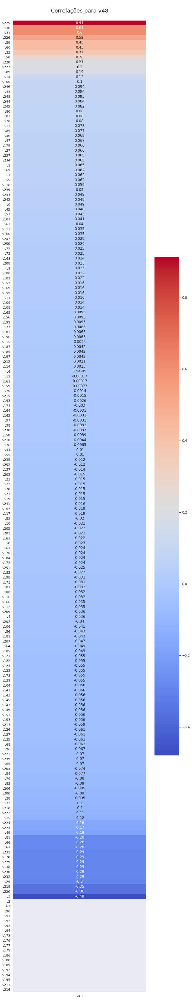

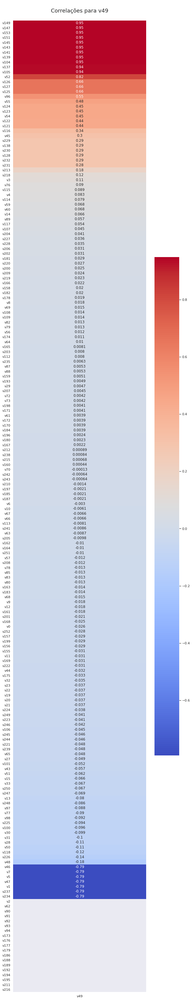

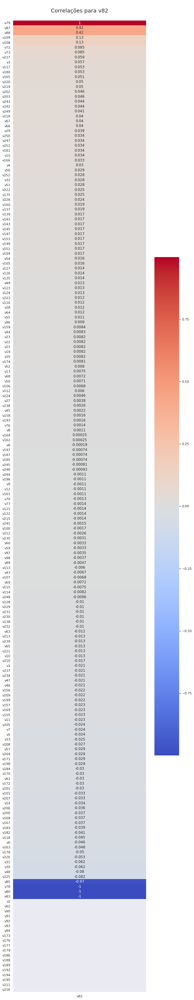

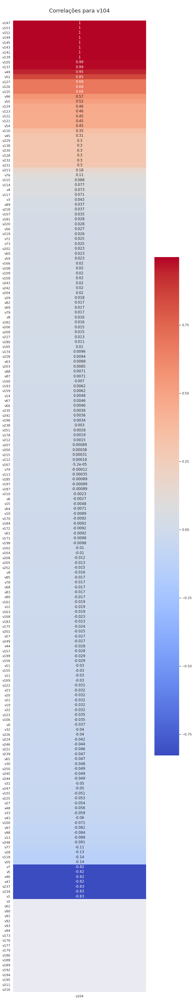

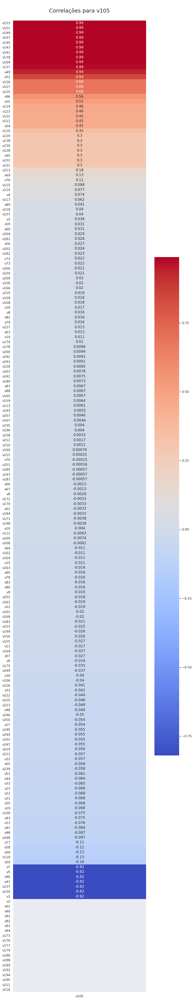

In [ ]:
for col in cid_columns:
  corr_to_target(full2,col,title = 'Correlações para '+ col, file='/content/drive/MyDrive/zica/correlacaopa'+col+'.png')

###Criando uma matriz com um string correspondente ao match de correlação e p-valor.

In [ ]:
def classecat(num):
  if abs(num) >= 0.7:
    return 'Correlação Forte'
  elif 0.5 <= abs(num) < 0.7:
    return 'Correlação Moderada'
  elif 0.3 <= abs(num) < 0.5:
    return 'Correlação Fraca'
  else:
    return 'Não há Correlação'

In [ ]:
def classepval(num):
  if abs(num) < 0.001:
    return 'Certeza Alta'
  elif 0.01 <= abs(num) < 0.05:
    return 'Certeza Moderada'
  elif 0.05 <= abs(num) < 0.1:
    return 'Certeza Fraca'
  else:
    return 'Nível de Certeza Ináceitável'

In [ ]:
relacoes = correlacao.copy()
for i in range(len(relacoes)):
  for col in relacoes[i]:
    (relacoes[i])[col] = (relacoes[i])[col].map(classecat)+ ' e '+ (p_valor[i])[col].map(classepval)

In [ ]:
relacoes[0]

,v0,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v19,v20,v21,v22,v23,v27,v28,v29,v30,v31,v32,v33,v43,v44,v45,v46,v47,v48,v49,v50,v51,v52,v54,v55,v56,v57,v59,v60,v61,v62,v63,v64,v65,v66,v67,v68,v69,v70,v72,v73,v76,v77,v78,v79,v80,v82,v83,v85,v87,v88,v89,v90,v91,v92,v93,v94,v96,v97,v98,v100,v101,v104,v105,v106,v107,v108,v109,v112,v113,v114,v115,v116,v117,v118,v121,v122,v123,v124,v125,v126,v127,v128,v137,v138,v139,v141,v143,v145,v147,v149,v151,v153,v155,v156,v157,v158,v159,v160,v161,v162,v163,v164,v165,v166,v167,v168,v169,v170,v171,v172,v173,v174,v175,v176,v177,v178,v179,v180,v181,v182,v183,v184,v185,v186,v187,v188,v189,v192,v193,v194,v195,v196,v197,v198,v199,v200,v201,v202,v203,v204,v205,v206,v207,v208,v209,v210,v211,v212,v213,v215,v216,v218,v219,v220,v221,v222,v223,v224,v225,v226,v227,v228,v229,v230,v231,v232,v234,v235,v237,v238,v239,v241,v242,v243,v244,v245,v246,v247,v248,v249,v250,v251,v252
v0,Correlação Forte e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Moderada e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Moderada e Certeza Alta,Correlação Moderada e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Forte e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Fraca e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Moderada

In [ ]:
relacoes[1]

,v0,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v19,v20,v21,v22,v23,v27,v28,v29,v30,v31,v32,v33,v43,v44,v45,v46,v47,v48,v49,v50,v51,v52,v54,v55,v56,v57,v59,v60,v61,v62,v63,v64,v65,v66,v67,v68,v69,v70,v72,v73,v76,v77,v78,v79,v80,v82,v83,v85,v87,v88,v89,v90,v91,v92,v93,v94,v96,v97,v98,v100,v101,v104,v105,v106,v107,v108,v109,v112,v113,v114,v115,v116,v117,v118,v121,v122,v123,v124,v125,v126,v127,v128,v137,v138,v139,v141,v143,v145,v147,v149,v151,v153,v155,v156,v157,v158,v159,v160,v161,v162,v163,v164,v165,v166,v167,v168,v169,v170,v171,v172,v173,v174,v175,v176,v177,v178,v179,v180,v181,v182,v183,v184,v185,v186,v187,v188,v189,v192,v193,v194,v195,v196,v197,v198,v199,v200,v201,v202,v203,v204,v205,v206,v207,v208,v209,v210,v211,v212,v213,v215,v216,v218,v219,v220,v221,v222,v223,v224,v225,v226,v227,v228,v229,v230,v231,v232,v234,v235,v237,v238,v239,v241,v242,v243,v244,v245,v246,v247,v248,v249,v250,v251,v252
v0,Correlação Forte e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Fraca e Certeza Alta,Não há Correlação e Certeza Moderada,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Forte e Certeza Alta,Correlação Forte e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Moderada e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Fraca,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Cor

###Salvando a matriz de correlações em pickle.

In [ ]:
with open('relacoes.pkl','wb') as f:
  pickle.dump(relacoes,f,pickle.HIGHEST_PROTOCOL)

In [ ]:
from google.colab import files
files.download('relacoes.pkl')

###Fazendo o scatterplot das variáveis de CID10 com as demais variáveis do banco para análise gráfica de correlação.

In [ ]:
z=sorted(np.unique(['v225','v151','v147','v143','v139','v137','v125','v7','v46','v237','v79','v78','v83','v153','v149','v145','v141','v105','v49','v127','v125','v5','v46','v47','v237','v153','v149','v145','v141','v104','v49','v127','v125','v46','v47','v1','v5']))

In [ ]:
x_vars = z
y_vars=cid_columns

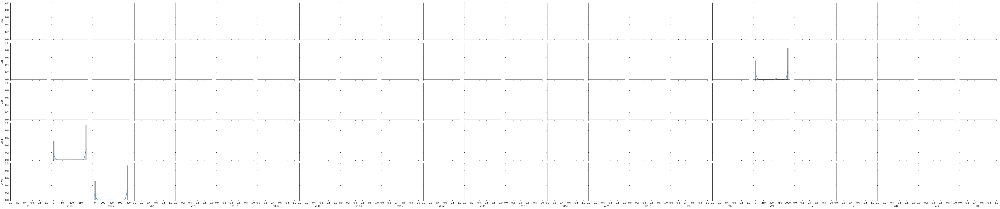

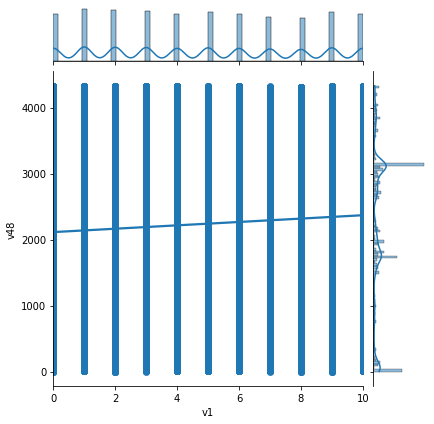

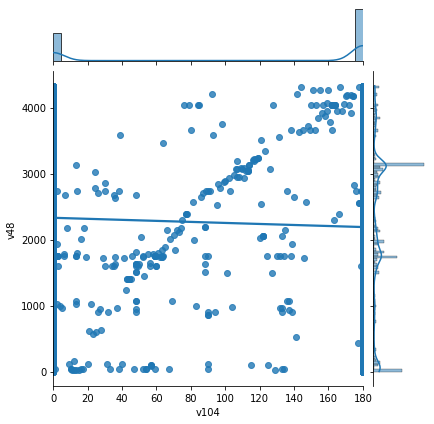

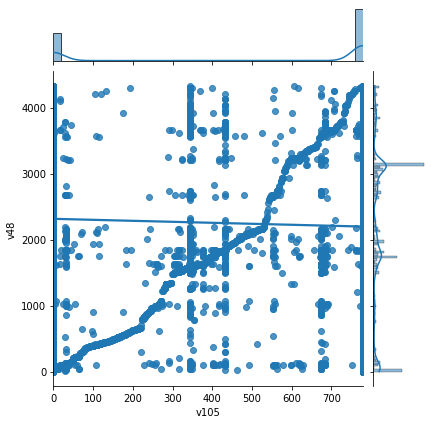

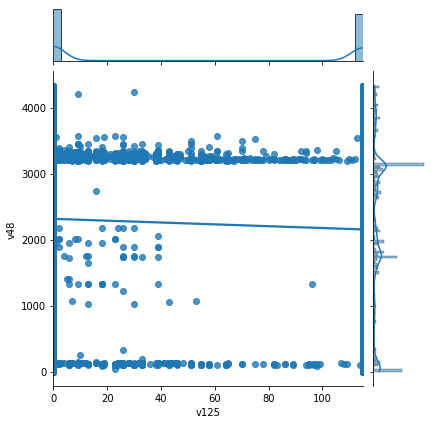

...

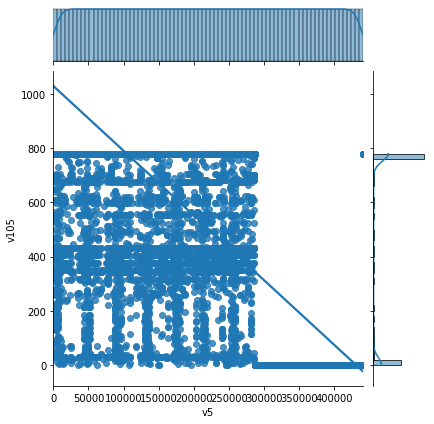

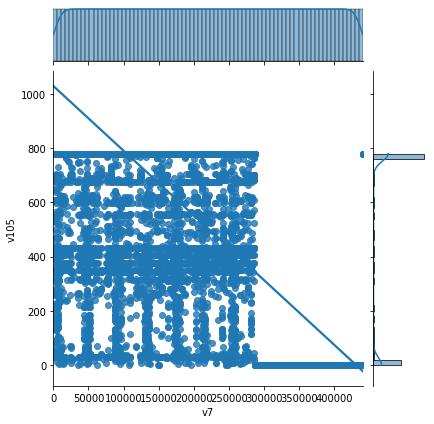

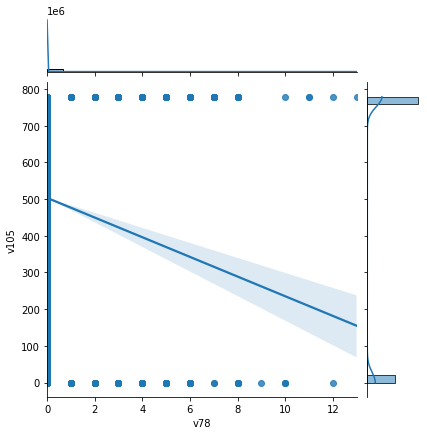

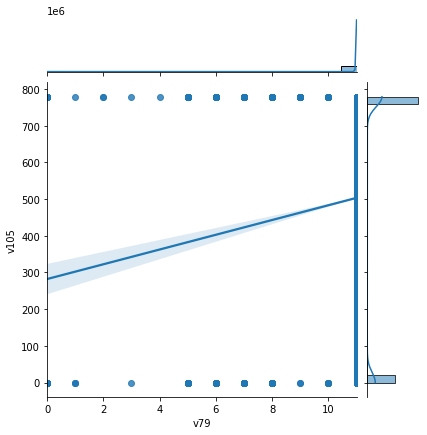

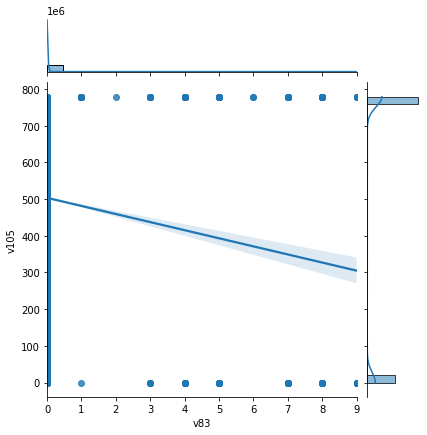

In [ ]:
plt.ioff()
g = sns.PairGrid(full2,x_vars = x_vars, y_vars=y_vars, palette='rocket')
g.map_diag(sns.histplot, kde=True)
g.map_offdiag(sns.jointplot, kind='reg')
#plt.savefig('/content/drive/MyDrive/zica/pairplotpa01'+x_vars+y_vars+'.png',format = 'png',dpi=600)
plt.show();

###Fazendo o Q-Q Plot das Variáveis do Banco.



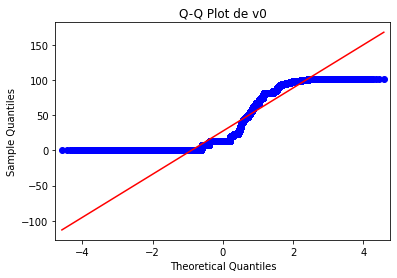

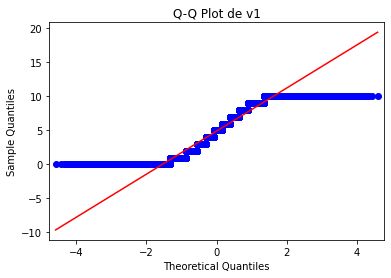

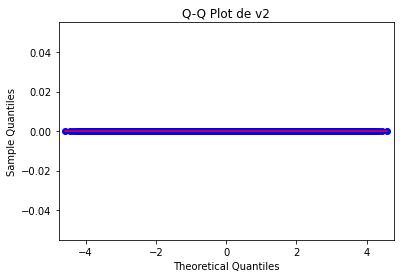

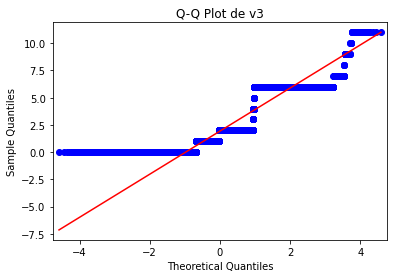

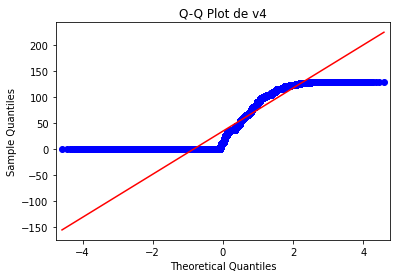

...

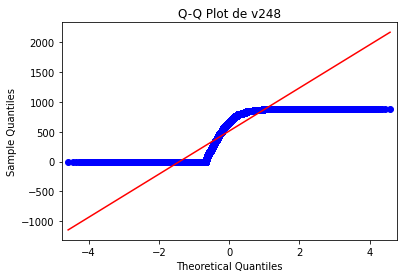

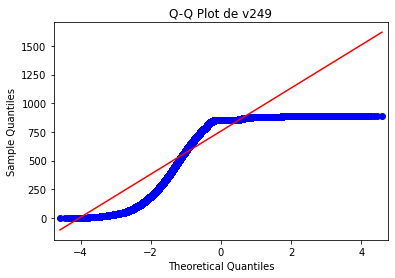

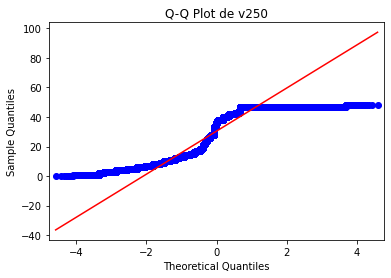

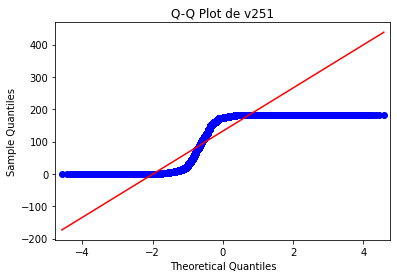

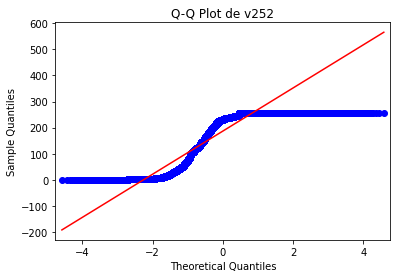

In [ ]:
plt.ioff()
for col in full2.columns:
  sm.qqplot(full2[col], line='s')
  plt.title('Q-Q Plot de ' + col)
  #plt.savefig('/content/drive/MyDrive/zica/qqplotgo'+ col +'.png',format='png',dpi=600)
  plt.show();

###Fazendo o Box Plot das Variáveis.

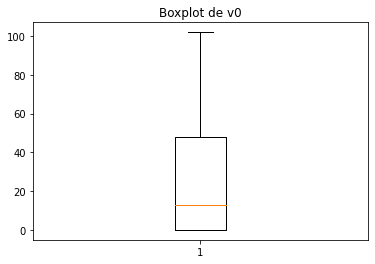

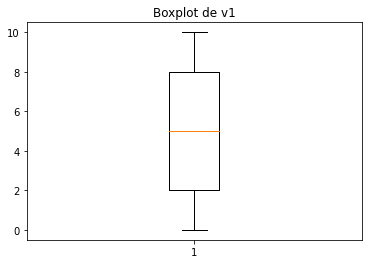

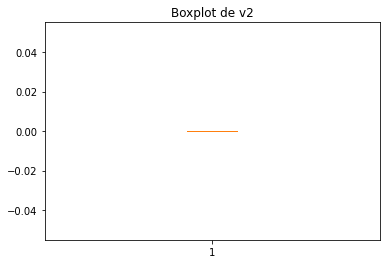

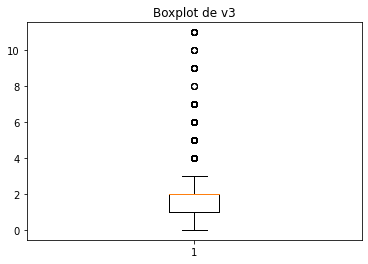

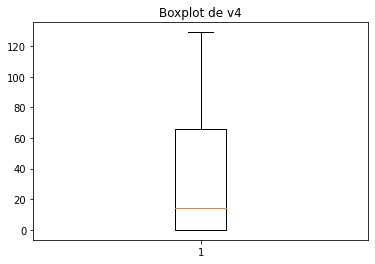

...

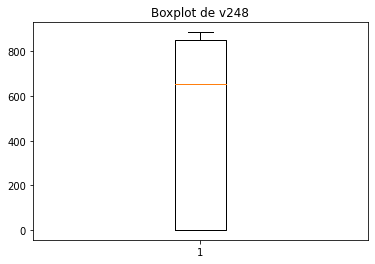

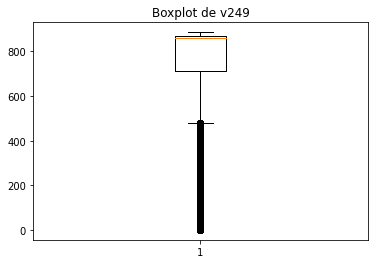

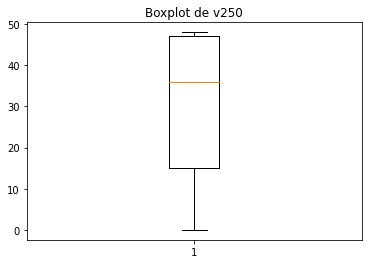

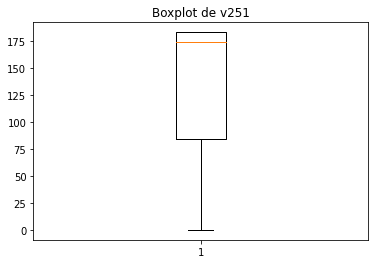

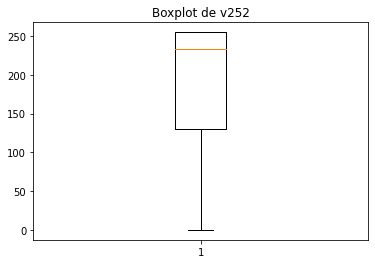

In [ ]:
plt.ioff()
for col in full2.columns:
  plt.boxplot(full2[col])
  plt.title('Boxplot de ' + col)
  #plt.savefig('/content/drive/MyDrive/zica/qqplotgo'+ col +'.png',format='png',dpi=600)
  plt.show();